In [7]:
using Distributions,Statistics,Random,Gillespie,Plots,StatsBase, ProgressMeter

In [8]:
function F(x,parms)

    mRNA_TF_1, TF_1, mRNA_TF_2, TF_2, miRNA, mRNA_t, target = x

    (k_w,g_w,k_q,g_q, k_s0, h_s, g_s, k_r0, h_r, g_r, k_p0, h_p, g_p, c) = parms
    
    mRNA_1_transcription = k_w
    mRNA_1_degradation = g_w * mRNA_TF_1
    TF_1_translation = k_q*mRNA_TF_1
    TF_1_degradation= g_q*TF_1

    mRNA_2_transcription = k_w
    mRNA_2_degradation = g_w * mRNA_TF_2
    TF_2_translation = k_q * mRNA_TF_2
    TF_2_degradation = g_q * TF_2

    miRNA_transcription = k_s(TF_1, k_s0, h_s, c)
    miRNA_degradation = g_s * miRNA

    mRNA_t_translation = k_r(TF_2, k_r0, h_r, c)
    mRNA_t_degradation= g_r * mRNA_t

    target_translation = k_p(miRNA, k_p0, h_p, c) * mRNA_t
    target_degradation = g_p * target
    
    [mRNA_1_transcription, mRNA_1_degradation, TF_1_translation, TF_1_degradation, 
    mRNA_2_transcription, mRNA_2_degradation, TF_2_translation, TF_2_degradation,
    miRNA_transcription, miRNA_degradation,
    mRNA_t_translation, mRNA_t_degradation, target_translation, target_degradation]
end

function k_r(q, k_r0, h_r, c)
    return k_r0 * q^c / (h_r^c + q^c)
end

function k_s(q, k_s0, h_s, c)
    return k_s0 * q^c / (h_s ^ c + q^c)
end

function k_p(s, k_p0, h_p, c)
    return k_p0 / (1 + s^c/h_s^c)
end

nu = [[1 0 0 0 0 0 0];
    [-1 0 0 0 0 0 0];
    [0 1 0 0 0 0 0];
    [0 -1 0 0 0 0 0];
    [0 0 1 0 0 0 0];
    [0 0 -1 0 0 0 0];
    [0 0 0 1 0 0 0];
    [0 0 0 -1 0 0 0];
    [0 0 0 0 1 0 0];
    [0 0 0 0 -1 0 0];
    [0 0 0 0 0 1 0];
    [0 0 0 0 0 -1 0];
    [0 0 0 0 0 0 1];
    [0 0 0 0 0 0 -1]]

14×7 Matrix{Int64}:
  1   0   0   0   0   0   0
 -1   0   0   0   0   0   0
  0   1   0   0   0   0   0
  0  -1   0   0   0   0   0
  0   0   1   0   0   0   0
  0   0  -1   0   0   0   0
  0   0   0   1   0   0   0
  0   0   0  -1   0   0   0
  0   0   0   0   1   0   0
  0   0   0   0  -1   0   0
  0   0   0   0   0   1   0
  0   0   0   0   0  -1   0
  0   0   0   0   0   0   1
  0   0   0   0   0   0  -1

In [2]:
# condizioni iniziali specie
x0=[0, 0, 0, 0, 0, 0, 0]

#valori rate
k_w = 0.06
g_w = 0.006
k_q = 0.04
g_q = 0.002
k_s0 = 0.5
h_s = 200 
g_s = 0.006
k_r0 = 0.8
h_r = 200
g_r = 0.006
k_p0 = 0.04
h_p = 60
g_p = 0.002
c = 2
      
#array parametri
parms=[k_w,g_w,k_q,g_q, k_s0, h_s, g_s, k_r0, h_r, g_r, k_p0, h_p, g_p, c]

#tempo max
t_f = 50 * log(2) / g_p

#simulazione
res = ssa(x0,F,nu,parms,t_f)

#step temporali
time_steps = res.time

#traiettoria specie 1 (mRNA_TF_1)
#mRNA_1_traj = res.data[:,1]

#traiettoria specie 2 (TF_1)
TF1_traj = res.data[:,2]

#traiettoria specie 3 (mRNA_TF_2)
#mRNA_2_traj = res.data[:, 3]

#traiettoria specie 4 (TF_2))
TF2_traj = res.data[:,4]

#traiettoria specie 5 (miRNA)
miRNA_traj = res.data[:,5]

#traiettoria specie 6 (mRNA_t)
#mRNA_t_traj = res.data[:,6]

#traiettoria specie 7 (target)
target_traj = res.data[:,7]

UndefVarError: UndefVarError: `ssa` not defined

In [5]:
t_f

17328.67951399863

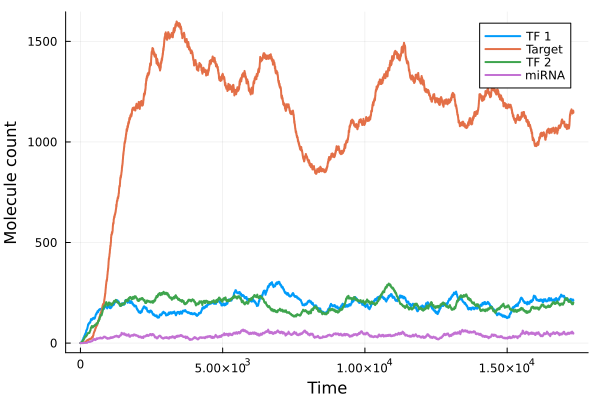

In [11]:
plot(time_steps, TF1_traj, label="TF 1", xlabel="Time", ylabel="Molecule count", lw=2)
plot!(time_steps, target_traj, label="Target", lw=2)
plot!(time_steps, TF2_traj, label="TF 2", lw=2)
plot!(time_steps, miRNA_traj, label="miRNA", lw=2)


In [30]:
savefig("separated_trajectories.png")

"/Users/andrearosini/Desktop/inference/julia/separated_trajectories.png"

Starting 100%|███████████████████████████████████████████| Time: 0:21:02


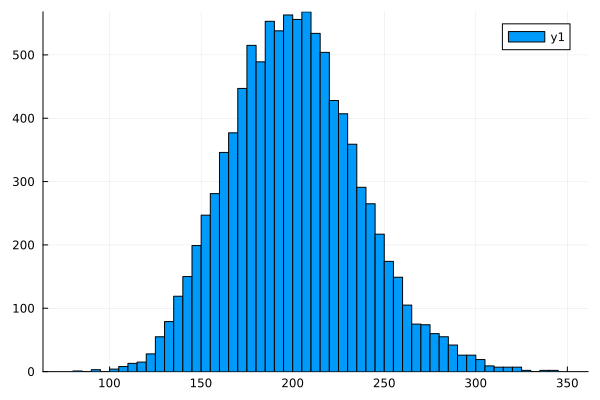

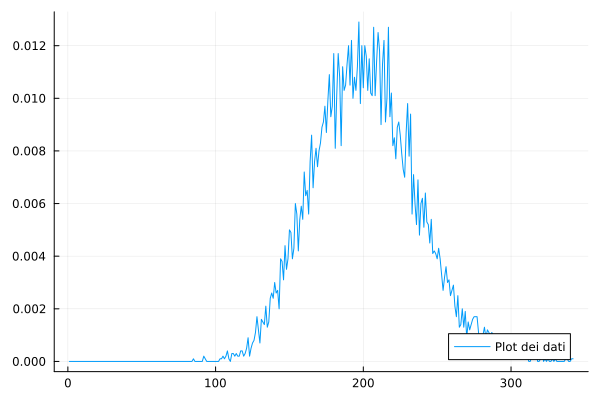

In [ ]:
Nsim = 10000
TF_av = zeros(Nsim)
p = Progress(Nsim, 1, "Starting")
target_av = zeros(Nsim)
miRNA_av = zeros(Nsim)
TF2_av = zeros(Nsim)
for i in 1:Nsim
    res = ssa(x0,F,nu,parms,t_f)
    TF1_traj = res.data[:,2]
    TF2_traj = res.data[:,4]
    miRNA_traj = res.data[:,5]
    target_traj = res.data[:,7]
    TF_av[i] = TF2_traj[end]
    TF2_av[i] = TF1_traj[end]
    miRNA_av[i] = miRNA_traj[end]
    target_av[i] = target_traj[end]
    next!(p)
end


TF_av = Int.(TF_av)
count_TF= zeros(maximum(TF_av)+1)
for i in 1:length(TF_av)
    count_TF[TF_av[i] + 1] += 1; 
end
count_TF ./= sum(count_TF)

target_av = Int.(target_av)
count_target= zeros(maximum(target_av)+1)
for i in 1:length(target_av)
    count_target[target_av[i] + 1] += 1; 
end
count_target ./= sum(count_target)

histogram(target_av) |> display
plot(count_target, label="Plot dei dati", legend=:bottomright) |> display

histogram(TF_av) |> display
plot(count_TF, label="Plot dei dati", legend=:bottomright) |> display

In [19]:
me_TF = mean(TF_av)
var_TF = std(TF_av)
me_target = mean(target_av)
var_target = std(target_av)
me_miRNA = mean(miRNA_av)
var_miRNA = std(miRNA_av)

9.1243643390901

In [20]:
me_target, var_target

(1259.763, 187.82029250650135)

In [21]:
CV_TF = var_TF / me_TF
CV_target = var_target / me_target

0.14909176766304563

In [9]:
kw_list = [0.24, 0.12, 0.08, 0.06, 0.04, 0.03, 0.02, 0.01]
kq_list = [0.01, 0.02, 0.03, 0.04, 0.06, 0.08, 0.12, 0.24]


8-element Vector{Float64}:
 0.01
 0.02
 0.03
 0.04
 0.06
 0.08
 0.12
 0.24

In [ ]:
N_k = length(kw_list)
Nsim = 5000
t_f = 10000.0
TF_vec = zeros(Nsim)
target_vec = zeros(Nsim)
CV_TF_vec = zeros(N_k)
CV_target_vec = zeros(N_k)

In [12]:

p = Progress(Nsim*N_k, 1, "Starting simulation:")
for j in 2:N_k
    println("Simulazione $j")
    k_w = kw_list[j]
    k_q = kq_list[j]
    parms=[k_w,g_w,k_q,g_q, k_s0, h_s, g_s, k_r0, h_r, g_r, k_p0, h_p, g_p, c]

    for i in 1:Nsim
        res = ssa(x0,F,nu,parms,t_f)
        TF_traj = res.data[:,4]
        target_traj = res.data[:,7]
        TF_vec[i] = TF_traj[end]
        target_vec[i] = target_traj[end]
        next!(p)
    end
    me_TF = mean(TF_vec)
    me_target = mean(target_vec)
    std_TF = std(TF_vec)
    std_target = std(target_vec)
    CV_TF_vec[j] = std_TF / me_TF
    CV_target_vec[j] = std_target / me_target
end
    

Simulazione 2


Starting simulation:  12%|███▉                           |  ETA: 0:39:01

Simulazione 3


Starting simulation:  25%|███████▊                       |  ETA: 0:32:35

Simulazione 4


Starting simulation:  37%|███████████▋                   |  ETA: 0:27:12

Simulazione 5


Starting simulation:  50%|███████████████▌               |  ETA: 0:24:38

Simulazione 6


Starting simulation:  62%|███████████████████▍           |  ETA: 0:19:42

Simulazione 7


Starting simulation:  75%|███████████████████████▎       |  ETA: 0:13:38

Simulazione 8


Starting simulation:  87%|███████████████████████████▏   |  ETA: 0:06:58

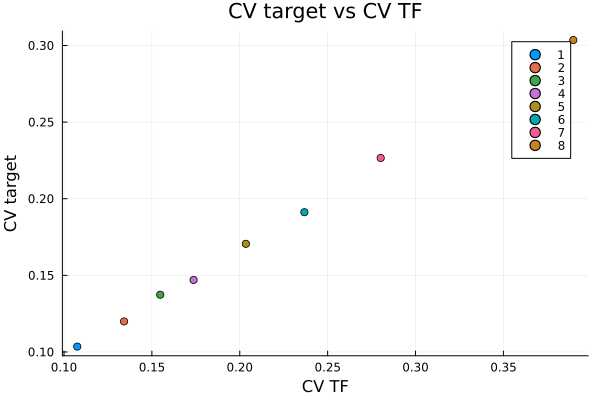

In [15]:
scatter(CV_TF_vec, CV_target_vec, group=1:N_k, legend=:topright, xlabel="CV TF", ylabel="CV target", title="CV target vs CV TF")

In [14]:
@show CV_TF_vec
@show CV_target_vec

CV_TF_vec = [0.10755107551328258, 0.1341847340103233, 0.15475048364776317, 0.17372387796779476, 0.20345638218299866, 0.2367710155083725, 0.28018638522116435, 0.38977083456893163]
CV_target_vec = [0.10350406329612676, 0.1199148391920102, 0.13733923606680876, 0.14699594792723947, 0.17057983363239307, 0.19119405100771467, 0.22657626092773409, 0.3035264779339472]


8-element Vector{Float64}:
 0.10350406329612676
 0.1199148391920102
 0.13733923606680876
 0.14699594792723947
 0.17057983363239307
 0.19119405100771467
 0.22657626092773409
 0.3035264779339472